# Setup

In [2]:
!pip install -Uq diffusers mermaid-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.0 MB/s eta 0:00:00


In [3]:
from PIL import Image
import torch
from torchvision.transforms.functional import to_tensor
from diffusers import AutoencoderKL, UNet2DConditionModel, DDIMScheduler
from transformers import CLIPTextModel, CLIPTokenizer
import numpy as np
import matplotlib.pyplot as plt
from math import ceil
from functools import partial
from tqdm.auto import tqdm
import cv2 as cv
from itertools import chain
from scipy.ndimage import binary_fill_holes

Functions used to nicely display images

In [4]:
def match_list_size(l1, l2, fill_with=None):
    if len(l1) > len(l2):
        extend_list = l2
    elif len(l2) > len(l1):
        extend_list = l1
    else:
        return

    extend_list.extend([fill_with]*(abs(len(l1) - len(l2))))


def items_to_grid(items, col_count, ax_func, titles=None, screen_width=26):
    titles = titles or []
    items_iter = iter(items)
    row_count = ceil(len(items)/col_count)
    plt.rcParams['figure.figsize'] = [screen_width, (screen_width/col_count)*row_count]
    f, axarr = plt.subplots(row_count, col_count)
    curr_row = 0

    try:
        flat_axs = list(chain.from_iterable(axarr))
    except:
        flat_axs = axarr
    match_list_size(flat_axs, titles)

    for ax, title in zip(flat_axs, titles):
        if (item := next(items_iter, None)) is not None:
            ax_func(item, ax)
        else:
            ax.axis('off')
        if title:
            ax.set_title(title)

    plt.subplots_adjust(wspace=.05, hspace=.05)


def images_to_grid(images, col_count, *args, **kwargs):
    def ax_func(img, ax):
        ax.imshow(img)
        ax.axis('off')
    items_to_grid(images, col_count, ax_func, *args, **kwargs)


def latents_to_grid_bw(latents, col_count, *args, **kwargs):
    def ax_func(img, ax):
        ax.imshow(img, cmap="gray")
        ax.axis('off')
    items_to_grid(latents, col_count, ax_func, *args, **kwargs)


def masks_to_grid(original_image, masks, col_count, *args, **kwargs):
    ax_func = partial(plot_mask, original_image)
    items_to_grid(masks, col_count, ax_func, *args, **kwargs)

In [5]:
def encode(image):
    with torch.no_grad():
        img_tensor = to_tensor(image)
        img_tensor = img_tensor[:3]
        img_tensor =  (img_tensor * 2 - 1).clamp(-1, 1)
        img_tensor.unsqueeze_(0)

        latent = vae.encode(img_tensor.to("cuda").half())
        latent = 0.18215 * latent.latent_dist.sample()
    return latent

In [6]:
# Function which can convert latents back into an image
def to_image(latents):
    with torch.no_grad():
        image = vae.decode(1 / 0.18215 * latents).sample
        image = (image / 2 + 0.5).clamp(0, 1)
        image = image[0].detach().cpu().permute(1, 2, 0).numpy()
        image = (image * 255).round().astype("uint8")
        return Image.fromarray(image)

In [7]:
def show_arr(np_arr):
    with torch.no_grad():
        image = (np_arr / 2 + 0.5).clamp(0, 1)
        image = image[0].detach().cpu().numpy()
        image = (image * 255).round().astype("uint8")
        return Image.fromarray(image)

In [8]:
def plot_mask(original_image, mask, ax=plt):
    mask_scaled = np.array(Image.fromarray(mask).resize((512,512), resample=Image.BOX))
    ax.imshow(np.array(original_image), cmap='gray')
    ax.imshow(
        abs(mask_scaled-1),
        cmap='binary',
        alpha=0.5*(mask_scaled > 0.5).astype(float)
    )
    ax.axis('off')
    return ax

In [9]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema", torch_dtype=torch.float16).to("cuda")
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet", torch_dtype=torch.float16).to("cuda")
tokenizer = CLIPTokenizer.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16)
text_encoder = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14", torch_dtype=torch.float16).to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/905 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.52k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.71G [00:00<?, ?B/s]

# DiffEdit

DiffEdit utilises the diffusion model which is used to predict where noise is in an image, typically as a way of generating images using text prompts.

We use the DiffEdit technique to modify an image of a horse into an image of a zebra.

In [10]:
from mermaid import Mermaid
Mermaid("""
flowchart TD

    style step1 rx:10,ry:10
    style step2 rx:10,ry:10
    style step3 rx:10,ry:10
    style substep rx:10,ry:10
    style subsubstep rx:10,ry:10


    subgraph step1[Step 1: Generate mask]
        direction LR
        A[/ Input image /] --> B
        B[ Noise ] --> C
        C[ Denoise by each prompt ] --> D
        D[ Compute noise difference ] -- Binarise --> E
        E[/ Output mask/]
    end

    subgraph step2[Step 2: Add noise to encoded original image]
        direction LR
        end

    subgraph step3[Step 3: Denoise]
        direction LR
        substep -- Step count reached --> I
        I[/ Output image /]
    end

    subgraph substep[Mask-wise denoising loop]
        direction RL
        subsubstep --> loopstep
        loopstep --> subsubstep
    end

    subgraph subsubstep[ ]
        direction LR
        F[ Denoise latents by new prompt ] --> H
        G[ Noise original image] --> H
        H[Combine by mask] --> J
        J[Input to next step]
    end

    subgraph loopstep[ Repeat ]

    end

    step1 --> step2
    step2 --> step3
""")

In the sections below we will work through these steps. First we will work through generating that mask and demonstrate a few techniques for improving the mask, then noise our original image, before finally utilising that mask to only edit one part of our original image.

# Creating the image mask

The first step of the DiffEdit technique is creating the mask by utilising the difference in noise prediction between two text prompts. The first prompt is the part of the image that you want to replace, and the second prompt should be what you want to replace it with, so in our examples we're going to set our prompts to be `"horse"` and `"zebra"` respectively.

In [11]:
original_prompt = "horse"
new_prompt = "zebra"

We will also define a few initial variables which we will use throughout the code, including loading the initial image.

In [13]:
## If you are using the data by mounting the google drive, use the following :
from google.colab import drive
drive.mount('/content/gdrive')

##Ref:https://towardsdatascience.com/downloading-datasets-into-google-drive-via-google-colab-bcb1b30b0166

Mounted at /content/gdrive


In [14]:
import pathlib

In [20]:
img_path = pathlib.Path('/content/gdrive/MyDrive/diffusion_model/horse-cc.png')

In [21]:
height = 512
width = 512
original_image = Image.open(img_path).resize((height, width))

batch_size = 1

torch.manual_seed(99);

Let's take a look at our original image.

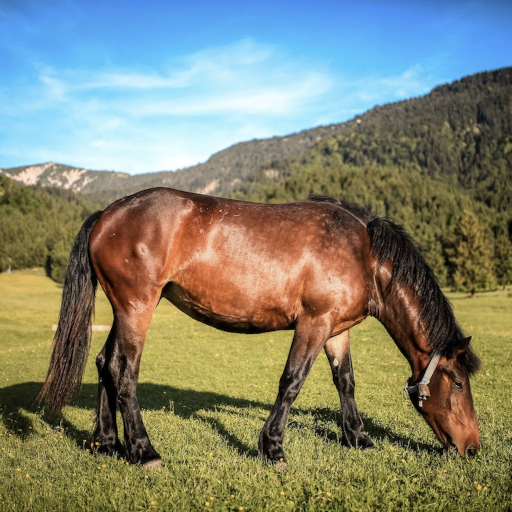

In [ ]:
original_image

Getting the difference in noise prediction between the two prompts is achieved by adding 50% noise to our original image, and then giving our diffusion model the two prompts and ask it to predict noise for both `"horse"` and `"zebra"`.
We can then take the difference in the noise predictions to create our mask.

This works because the original image is already an image of a horse, and so our `"horse"` prompt should create a noise prediction which is evenly distributed. For the `"zebra"` prompt however, while the background is plausible given the prompt, the horse in the foreground isn't very zebra-like at all, and so our model will predict that there must be additional noise in this area. This means that if we take the difference between the two predictions (averaged out over 10 times), then we should get a pretty good outline of a horse.

Our diffusion model is unable to work with images directly, so we first have to convert the image into latents using its variational autoencoder (VAE).

In [22]:
original_image_latents = encode(original_image)

In [23]:
original_image_latents.shape

torch.Size([1, 4, 64, 64])

We can see that the image has been converted into a 1x64x64x4 tensor, which is the latent format that our particular diffusion model can work with. The images below show you what those latents look like over the 4 layers:

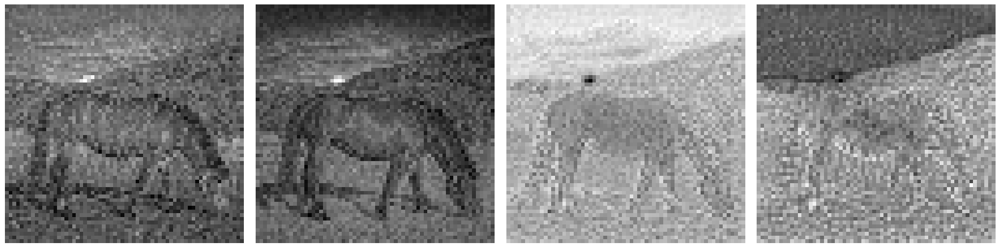

In [24]:
latents_to_grid_bw(original_image_latents.squeeze().detach().cpu(), 4)

NOTE: These 4 channels do not directly map to RGBA or any other format. The contents of the latents are completely determined by the VAE, and other VAE models trained in different ways would produce different latents from our original image.

## Prompt to Text Embeddings

We have now converted our original image into the correct format for our model, and we also need to do this for the text prompts we will be providing.

To do this we first use a tokenizer to map the text into number values, and then we use an encoder to convert them into tensors in a format that the model can work with. We have stored this behaviour in a handy function so that we can reuse this logic again later for other prompts.

In [25]:
def create_text_embeddings(prompts, batch_size=1):
    text_embeddings = []
    for prompt in prompts:
        text_input = tokenizer([prompt], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
        text_embeddings += text_encoder(text_input.input_ids.to("cuda"))[0].half().unsqueeze(0)

    # create matching unconditional input
    max_length = text_input.input_ids.shape[-1]
    uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
    uncond_embeddings = text_encoder(uncond_input.input_ids.to("cuda"))[0].half()

    return torch.cat([uncond_embeddings, *text_embeddings])

To get an idea of what the tokenised text looks like:

In [26]:
tokenizer(["horse"], padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")

{'input_ids': tensor([[49406,  4558, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407, 49407, 49407]]), 'attention_mask': tensor([[1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0]])}

We can see above that our prompt of `"horse"` has been converted into different tokens:

- `49406` is equal to start
- `4558` is equal to `"horse"`
- `49407` is equal to end/padding

The tensor is padded to be a particular length that the model expects, but an attention mask is also passed in which tells the model which tokens it should pay attention to, where `1` means it should pay attention to it and `0` means ignore. In this case it is the first three tokens only.

In [27]:
prompts = [original_prompt, new_prompt]
combined_embeddings = create_text_embeddings(prompts)

## Noising the original image

To add noise to our original image to the correct level, we will utilise the scheduler. The scheduler typically manages noise throughout the image creation process for diffusion models, and it can also be used to manually add a specific level of noise to an image.

First we need to set up the scheduler, and provide it with the configuration values that our diffusion model expects. We have used a DDIM scheduler, which is the type of scheduler that is recommended by the DiffEdit paper as it allows for more consistent results between the original image and the edited image.

We'll define this setup as a function as we'll be using it again later when we generate the DiffEdit image. The argument `num_inference_steps` is the total number of steps that our model would take to fully denoise an image. With the version of Stable Diffusion and the scheduler we have chosen, 50 steps usually works well.

In [28]:
scheduler_config = {
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "set_alpha_to_one": False,
  "steps_offset": 1,
  "trained_betas": None,
  "clip_sample": False
}

In [29]:
def init_scheduler(num_inference_steps):
    scheduler = DDIMScheduler(**scheduler_config)
    scheduler.set_timesteps(num_inference_steps)
    return scheduler

In [30]:
num_inference_steps = 50
scheduler = init_scheduler(num_inference_steps)

Next, we will define a generic function which creates noise and adds it to the latents we pass in. It also takes in a start step for the scheduler which allows us to control the amount of noise added to the image.

In [31]:
def create_noise(noise_scheduler, initial_latents, height=512, width=512, batch_size=1, start_step=10, seed=None):
    if seed is not None:
        torch.manual_seed(seed)
    initial_noise = torch.randn((batch_size, unet.config.in_channels, height // 8, width // 8)).to("cuda").half()

    if start_step > 0:
        return noise_scheduler.add_noise(
            initial_latents,
            initial_noise,
            timesteps=torch.tensor([noise_scheduler.timesteps[start_step]])
        )
    return initial_noise * noise_scheduler.init_noise_sigma

We will pass in the latents from our encoded original image into our new function, and we want to add 50% noise as suggested in the DiffEdit paper. Our function doesn't take in an amount of noise specifically, but allows us to specify which step the scheduler should use to noise the image. Halfway through the total number of steps will add 50% noise.

In [32]:
mask_noise_step = num_inference_steps//2
noisy_latents = create_noise(scheduler, original_image_latents, start_step=mask_noise_step)

We can then take a look at our noised latents to get an idea of what it they look like:

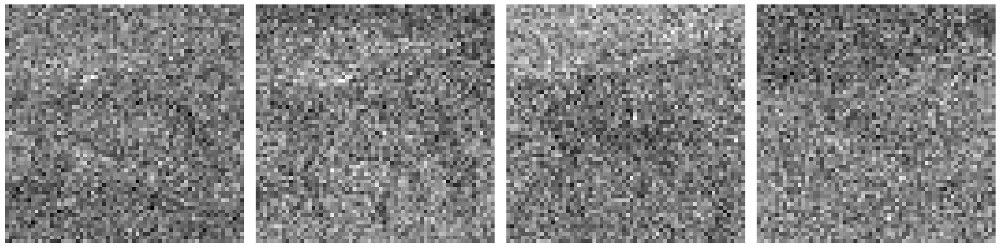

In [33]:
latents_to_grid_bw(noisy_latents.squeeze().detach().cpu(), 4)

We can also decode the noisy latents using our VAE. There's a hint of the original image there but certainly a lot of noise added too:

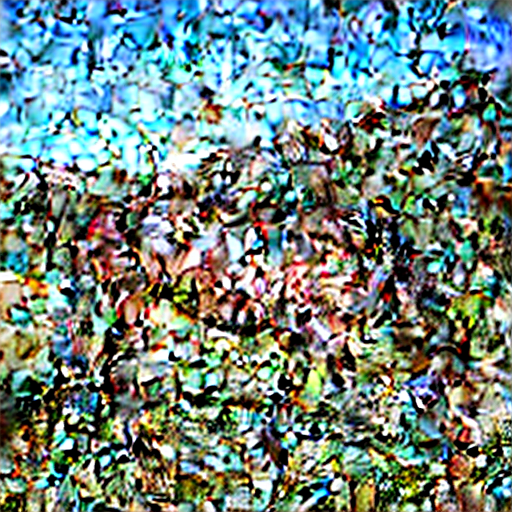

In [34]:
to_image(noisy_latents)

## Noise Prediction Code

Now that we have created the noisy latents, we need to use our model to predict where the noise is in the image, given the two prompts that we're working with. The noise prediction code that we will use here is very similar to the code you would use when doing image generation. The main differences are that we are starting with our original image latents with 50% noise, and only doing a single step of noise prediction unlike the 50 we would do when generating an image.

In [35]:
guidance_scale = 7.5

In [36]:
def predict_noise(scheduler, latents, combined_embeddings, guidance_scale, timestep, seed=None):
    if seed is not None:
        torch.manual_seed(seed)
    input = torch.cat([latents] * combined_embeddings.shape[0])
    input = scheduler.scale_model_input(input, timestep)

    # predict the noise residual
    with torch.no_grad():
        pred = unet(input, timestep, encoder_hidden_states=combined_embeddings).sample

    # perform guidance
    pred_uncond, pred_text_original, pred_text_new = pred.chunk(3)

    pred_original = pred_uncond + guidance_scale * (pred_text_original - pred_uncond)
    pred_new = pred_uncond + guidance_scale * (pred_text_new - pred_uncond)

    return pred_original, pred_new

The paper states that repeating the noise prediction 10 times allowed for a good mask to be generated, so we will use that value here.

In [37]:
n = 10

We will then loop through and make our noise predictions. Each loop we set a different seed so that the added noise will be different, and then we take the difference in the noise predictions for our two prompts, and then store this difference in our variable `all_preds_base`. At the end of all the loops we divide `all_preds_base` by our number of loops to get an average difference over our 10 predictions.

In [38]:
with torch.no_grad():
    all_preds_base = torch.zeros_like(original_image_latents)
    original_preds_base = torch.zeros_like(original_image_latents)
    new_preds_base = torch.zeros_like(original_image_latents)
    for i in range(n):
        seed=i*3
        noise = create_noise(scheduler, original_image_latents, start_step=25, seed=seed)
        original_preds, new_preds = predict_noise(scheduler,
                                                  noise,
                                                  combined_embeddings,
                                                  guidance_scale,
                                                  scheduler.timesteps[mask_noise_step],
                                                  seed=seed)
        original_preds_base += original_preds
        new_preds_base += new_preds
        all_preds_base += (new_preds - original_preds).abs()
    all_preds_base /= n
    original_preds_base /= n
    new_preds_base/= n

You can see here that the horse prompt gives a fairly even noise prediction over the ten loops, however the zebra prompt highlights the horse specifically. Since the noise prediction for the two prompts is also very similar for the background, this leaves us just with an outline of the horse when the two are subtracted.

In [39]:
images_to_grid([to_image(original_preds_base), to_image(new_preds_base), to_image(all_preds_base)], 3, titles=['"Horse" prompt noise prediction', '"Zebra" prompt noise prediction', "Difference in noise prediction"])

Output hidden; open in https://colab.research.google.com to view.

In [40]:
all_preds_base.shape

torch.Size([1, 4, 64, 64])

`all_preds_base` is currently still the same shape as the initial latents, so we need to combine those four channels into one. We do this by taking the mean of those four channels. After that, we want to normalise these values between 0 and 1, so that the difference numbers are easier to work with when creating the mask.

In [41]:
all_preds = all_preds_base.mean(axis=1)

all_preds = all_preds - all_preds.min()
all_preds = all_preds / all_preds.max()

In [42]:
all_preds.min(), all_preds.max()

(tensor(0., device='cuda:0', dtype=torch.float16),
 tensor(1., device='cuda:0', dtype=torch.float16))

In [43]:
all_preds = all_preds.squeeze().detach().cpu().numpy()

Now we've done some processing, the mask looks like this:

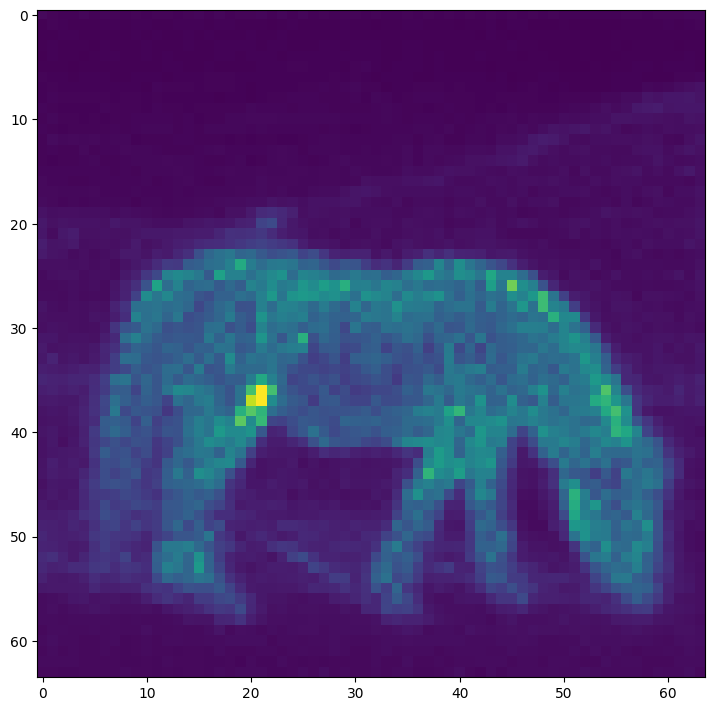

In [44]:
plt.imshow(all_preds)

That's a pretty good start, however what we really want is a mask which is either present or not at a certain pixel. To achieve this, we will set all values under a threshold as 0 and all above as 1, giving us binary values to work with for the mask. The DiffEdit paper suggests setting this threshold at 0.5, however with our testing we found a lower value was more effective. This may depend on the similarity of your two prompts.

We can write some code to test and visualise a few different values to allow us to choose one that works well for our image:

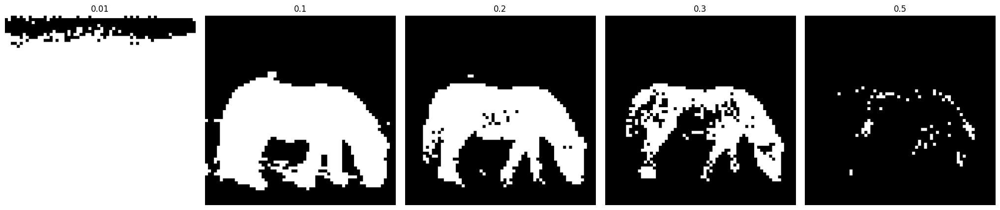

In [46]:
possible_thresholds = [0.01, 0.1, 0.2, 0.3, 0.5]
masks = [(all_preds > threshold) for threshold in possible_thresholds]
masks_to_grid(original_image, masks, len(possible_thresholds), titles=possible_thresholds)

0.1 looks like the best threshold we've got from the above section as the higher values no longer cover the whole horse. The shape isn't perfect however so we can do some more processing of the mask to improve its shape.

In [47]:
# set the best threshold value
initial_mask = (all_preds > 0.1).astype(float)

One technique to help with the coverage of the mask is to blur it a small amount. This can help to remove small holes and give a smoother outline on the mask.

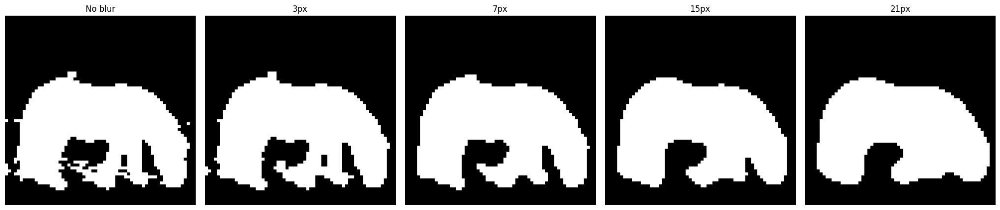

In [48]:
possible_blurs = [3, 7, 15, 21]
titles = [f"{i}px" for i in possible_blurs]

masks = [cv.GaussianBlur(np.array(initial_mask, dtype=np.uint8), (blur_px, blur_px), 0.) for blur_px in possible_blurs]
masks_to_grid(original_image, [initial_mask, *masks], len(possible_blurs) + 1, titles=["No blur", *titles])

7px looks like the best option here, it gives a smoother outline around the horse without losing the overall shape or uncovering parts of our image.

In [49]:
mask_np = (cv.GaussianBlur(np.array(initial_mask, dtype=np.uint8), (7, 7), 0.) > 0.1).astype(float)

If there are holes in the mask, there are other techniques that can help, such as `binary_fill_holes` from the `scipy.ndimage` package. We'll skip this since our example doesn't have any holes, but it can be another option to improve the mask further. For now, we'll stick with the mask we've created, which now looks like this:

<module 'matplotlib.pyplot' from '/usr/local/lib/python3.11/dist-packages/matplotlib/pyplot.py'>

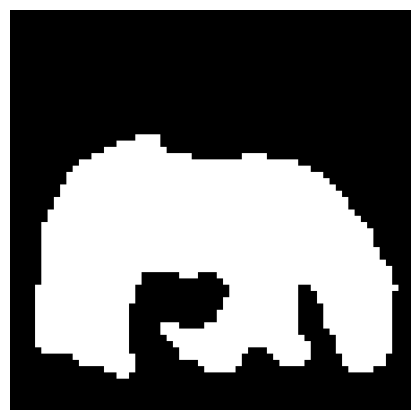

In [50]:
plot_mask(original_image, mask_np)

# Applying DiffEdit to our original image

Now we have a mask, we can utilise this to ensure that our image generation of our zebra only affects the sections under the mask. We do this using a standard image to image pipeline for a diffusion model, but with one main change. For each step of the denoising process, instead of removing the noise that our diffusion model predicts in the areas outside the mask, we will replace this with a version of our original image with the correct amount of noise. By doing this at each step of the denoising process, this allows the final generated image within the mask to seamlessly integrate with the original image outside of the mask, as we effectively trick it at each step into believing that it generated the background of the original image. We'll explain exactly how we do this in more detail later.

For now, we want to set up our image to image pipeline in the standard way, with one exception - we want to create two schedulers, one which handles the denoising of the image we are generating as normal, but another which allows us to correctly noise our original image to the correct level, which we then use within the denoising step.

In [51]:
# set how much of the initial image should be replaced by noise at the start
noise_strength = 0.75
# set a manual seed to ensure that we get consistent results
torch.manual_seed(3)

# create schedulers
denoising_scheduler = init_scheduler(num_inference_steps)
original_image_scheduler = init_scheduler(num_inference_steps)

# store step information
total_steps = len(scheduler.timesteps)
start_step = int(len(scheduler.timesteps)-(num_inference_steps*noise_strength))

# set up callback to see denoising process
intermediate_latents = []
callback = (lambda latents: intermediate_latents.append(latents))

# create text embeddings for new_prompt "zebra"
text_embeddings = create_text_embeddings([new_prompt])

mask = torch.from_numpy(mask_np).type(torch.half).to("cuda")

We use an image to image pipeline to pass in our original image, since we still want our zebra to have a similar pose to the horse which is present in our original image, so we add a lot of noise to the original image (~75%) and then we will use this as the starting point for our image generation of our zebra. We can see what that initial noise looks like below:

In [52]:
# create initial noisy latents
noisy_latents = create_noise(denoising_scheduler, original_image_latents, start_step=start_step)

Now we perform the denoising loop, starting with our noisy latents above and then progressively denoising the image using the prompt `"zebra"`.

At each step however we ensure that we only change the areas under the mask. We do this by calculating `xt` which is a version of our **original image latents** given the correct noise for the next step in the denoising process, and `yt` which is the slightly denoised latents which the scheduler has created **based on our U-Net's noise prediction**, and would typically be the input to the next step of the denoising loop for standard image generation.

Next we combine the two sets of latents, to ensure that `yt` (the generated latents) is only applied within the masked area, and `xt` (our original image latents) make up the rest of the image. We do this using an equation from the DiffEdit paper, and you can see that implemented in the code on the following line:
```python
noisy_latents = mask*yt+((1-mask)*xt)
```
Our mask is a tensor with either 1 or 0 as its values, where 1 is within the masked area and 0 values for everyhere else. The first part of this code `mask*yt` is effectively multiplying the latents by 0 outside of the masked area, stopping the generated latents from having any influence on the image outside of the masked area. The second part of the equation: `((1-mask)*xt)`, which is doing the opposite - `1-mask`, makes all of the non-masked areas be equal to 1 and the masked areas equal to 0, so when we multiply `xt` by this, we reduce the influence of these latents **within** the masked area to 0. We add the two parts of this equation together to produce the input latents to the next step, where `xt` makes up the non-masked area of the latents, but `yt` makes up the masked area. These latents then make the input to the next loop of the denoising process.

In [53]:
# denoising loop
for i, t in enumerate(tqdm(denoising_scheduler.timesteps[start_step:])):
    current_step = i + start_step
    next_step = current_step + 1

    input = torch.cat([noisy_latents] * 2)
    scaled_input = denoising_scheduler.scale_model_input(input, t)

    # predict the noise residual
    with torch.no_grad():
        pred = unet(scaled_input, t, encoder_hidden_states=text_embeddings).sample

    # perform guidance
    pred_uncond, pred_text = pred.chunk(2)
    pred_nonscaled = pred_uncond + guidance_scale * (pred_text - pred_uncond)
    pred = pred_nonscaled

    # compute the "previous" noisy sample
    if (next_step < num_inference_steps):
        xt = create_noise(original_image_scheduler, original_image_latents, start_step=next_step)
    else:
        xt = original_image_latents

    yt = denoising_scheduler.step(pred, t, noisy_latents).prev_sample

    noisy_latents = mask*yt+((1-mask)*xt)

    if callback:
        callback(noisy_latents)
final_latents = noisy_latents

  0%|          | 0/38 [00:00<?, ?it/s]

Once the denoising loop is complete, we can decode the final latents to see what our generated `"zebra"` DiffEdit image looks like!

In [54]:
images_to_grid([original_image, to_image(final_latents)], 2)

Output hidden; open in https://colab.research.google.com to view.

And there we have it! Our original horse has been completely replaced with our generated zebra image, and through the power of the DiffEdit process, you can see that the background has been untouched outside of the  masked area.

We also added a callback so that we could see the denoising process as it progressed. We started at step 12 since we wanted the original image to still guide the pose of our zebra in our output image.

In [61]:
images_indexes = [(to_image(l), i) for i, l in list(enumerate(intermediate_latents, start_step))[::6]]
i, l = zip(*images_indexes)
labels = [f"step {label}" for label in l]
images_to_grid([*i, to_image(final_latents)], 3, titles=[*labels, f"step {num_inference_steps}"])

Output hidden; open in https://colab.research.google.com to view.

## Putting it all together in functions

Now we've built up this process, we can put it into functions for easy reuse, with different images and prompts. We do this in the section below, using some of the functions we had defined in the code above. We will now be able to call a new function `diffedit` to invoke our DiffEdit pipeline:

In [56]:
def create_mask(original_image, caption, query, num_inference_steps=50, guidance_scale=7.5, seed=None, *args, **kwargs):
    if seed:
        torch.manual_seed(seed)

    text_embeddings = create_text_embeddings([caption, query])

    with torch.no_grad():
        original_image_latents = encode(original_image)
        all_preds_base = torch.zeros_like(original_image_latents)
        mask_scheduler = init_scheduler(num_inference_steps)
        seed_mul = seed or 3

        mask_noise_step = 40


        n = 10
        for i in range(n):
            noisy_latents = create_noise(mask_scheduler, original_image_latents, start_step=mask_noise_step, seed=i*3)
            original_preds, new_preds = predict_noise(mask_scheduler, noisy_latents, text_embeddings, guidance_scale, mask_scheduler.timesteps[mask_noise_step], seed=i*seed_mul)
            all_preds_base += (new_preds - original_preds).abs()

        all_preds_base /= n
        all_preds = all_preds_base.mean(axis=1)
        all_preds = all_preds.squeeze().detach().cpu().type(torch.float).numpy()
        all_preds = all_preds - all_preds.min()
        all_preds = all_preds / all_preds.max()

        initial_mask = (all_preds > 0.1).astype(float)
        blurred_mask = cv.GaussianBlur(np.array(initial_mask, dtype=np.uint8), (7, 7), 0.)
        mask_np = (binary_fill_holes(blurred_mask)> 0.1).astype(float)
        return mask_np


def masked_image_generation(original_image, query, mask, num_inference_steps=50, guidance_scale=7.5, noise_strength=1, seed=None, *args, **kwargs):
    if seed:
        torch.manual_seed(seed)

    # set how much of the initial image should be replaced by noise at the start
    original_image_latents = encode(original_image)

    # create schedulers
    denoising_scheduler = init_scheduler(num_inference_steps)
    original_image_scheduler = init_scheduler(num_inference_steps)

    # store step information
    total_steps = len(denoising_scheduler.timesteps)
    start_step = int(total_steps-(num_inference_steps*noise_strength))

    text_embeddings = create_text_embeddings([query])

    mask = torch.from_numpy(mask).type(torch.half).to("cuda")

    # create initial noisy latents
    noisy_latents = create_noise(denoising_scheduler, original_image_latents, start_step=start_step)
    to_image(noisy_latents)

    # denoising loop
    for i, t in enumerate(tqdm(denoising_scheduler.timesteps[start_step:])):
        current_step = i + start_step
        next_step = current_step + 1

        input = torch.cat([noisy_latents] * 2)
        input = denoising_scheduler.scale_model_input(input, t)

        # predict the noise residual
        with torch.no_grad():
            pred = unet(input, t, encoder_hidden_states=text_embeddings).sample

        # perform guidance
        pred_uncond, pred_text = pred.chunk(2)
        pred_nonscaled = pred_uncond + guidance_scale * (pred_text - pred_uncond)
        pred = pred_nonscaled

        # compute the "previous" noisy sample
        if (next_step < num_inference_steps):
            xt = create_noise(original_image_scheduler, original_image_latents, start_step=next_step)
        else:
            xt = original_image_latents

        yt = denoising_scheduler.step(pred, t, noisy_latents).prev_sample

        noisy_latents = mask*yt+((1-mask)*xt)

    return noisy_latents


def diffedit(original_image, caption, query, seed=None, *args, **kwargs):
    mask = create_mask(original_image, caption, query, seed=seed, *args, **kwargs)
    plot_mask(original_image, mask)
    final_latents = masked_image_generation(original_image, query, mask, seed=seed, *args, **kwargs)
    images_to_grid([original_image, to_image(final_latents)], 2)

Now our function is defined we can test it out! One of the prompts that the DiffEdit paper first shows is changing a bowl of fruits to a bowl of pears, so we'll also demonstrate that here:

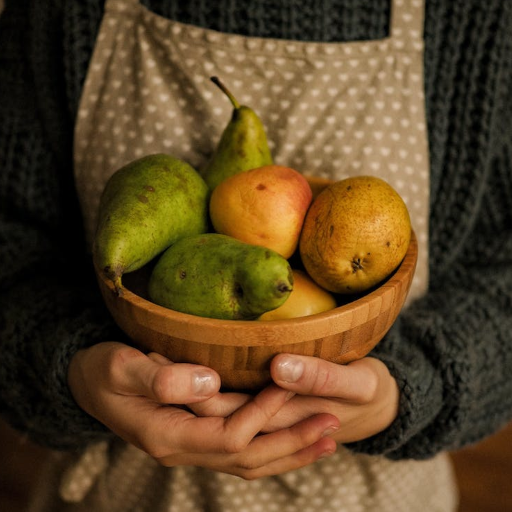

In [ ]:
img_path = '/kaggle/input/fruitbowl/fruit_holding.png'
fruit_bowl_image = Image.open(img_path).resize((512, 512))
fruit_bowl_image

  0%|          | 0/50 [00:00<?, ?it/s]

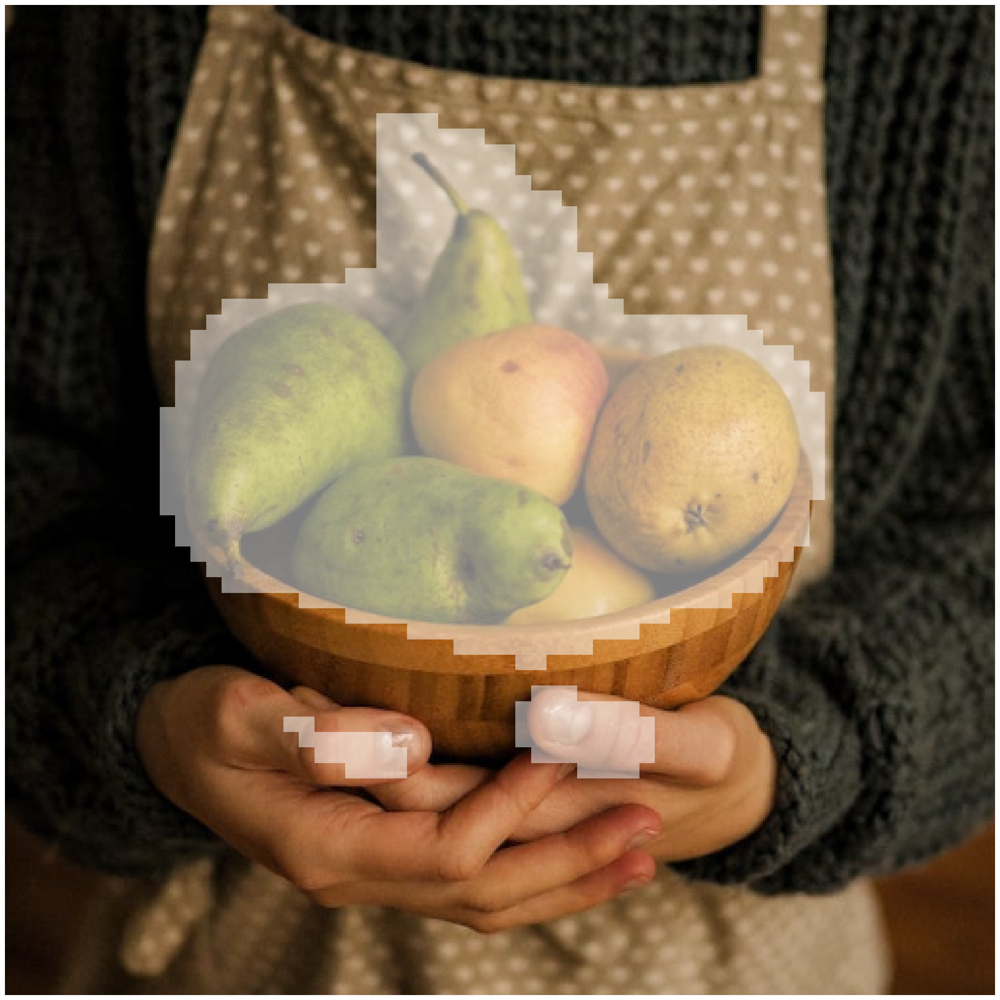

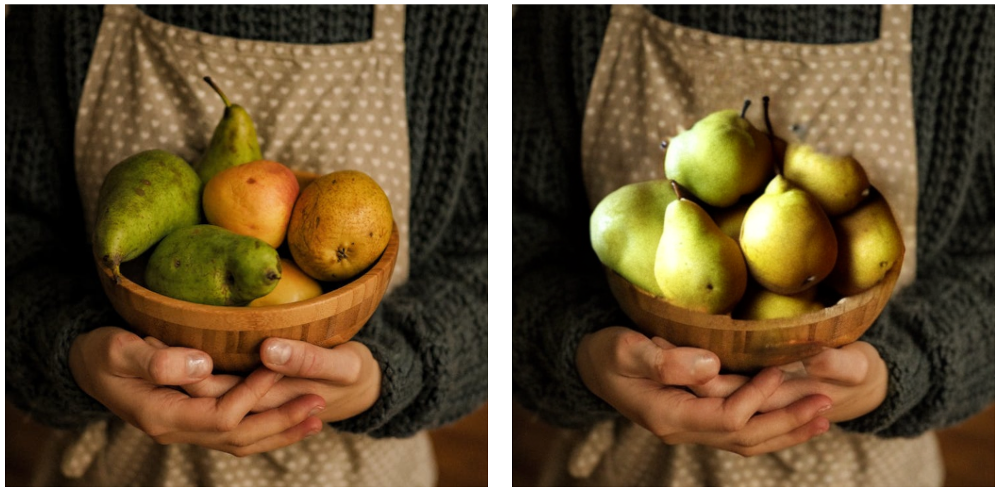

In [ ]:
caption = "a bowl of fruits"
query = "a bowl of pears"

diffedit(fruit_bowl_image, caption, query, noise_strength=1, seed=9)

We can see a very nice mask generation here, along with some slightly wonky looking pears, that's mainly an issue with our diffusion model's image generation in this case rather than anything that we've done specifically, so we'll accept slightly wonky pears for now.

## Limitations

Something else which is worth considering is the limitations of the DiffEdit mask creation technique. If there are huge differences between the original image caption and the query string then the mask that is generated is not as accurate, which has the knock-on effect of leading to poor final image generation. Take our example below, we'll use an image of a person holding a bowl, and use `"a bowl of fruits"` as the caption. We'll also pass in  `"sports cars"` as the query. As we can see the mask creation includes random areas of the background due to the lack of similarities with the original image and the intended query, and generates a rather odd final image.

  0%|          | 0/50 [00:00<?, ?it/s]

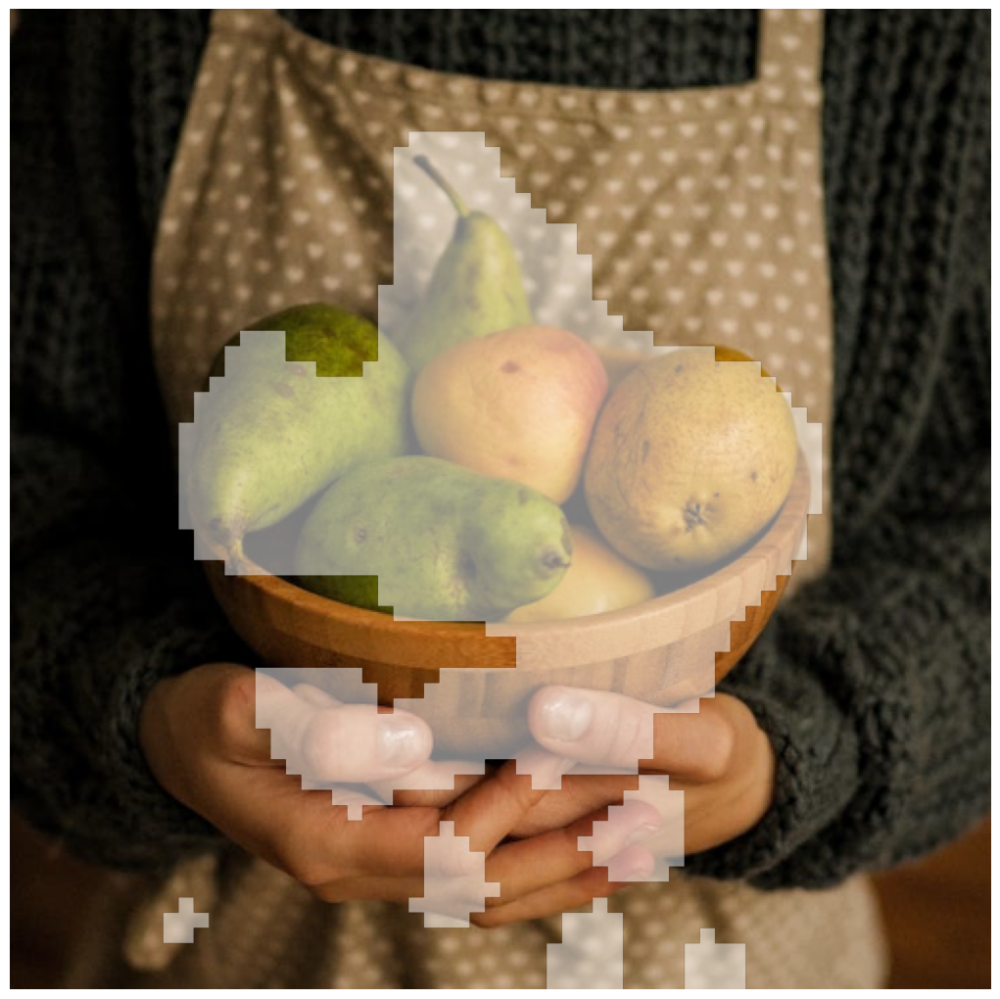

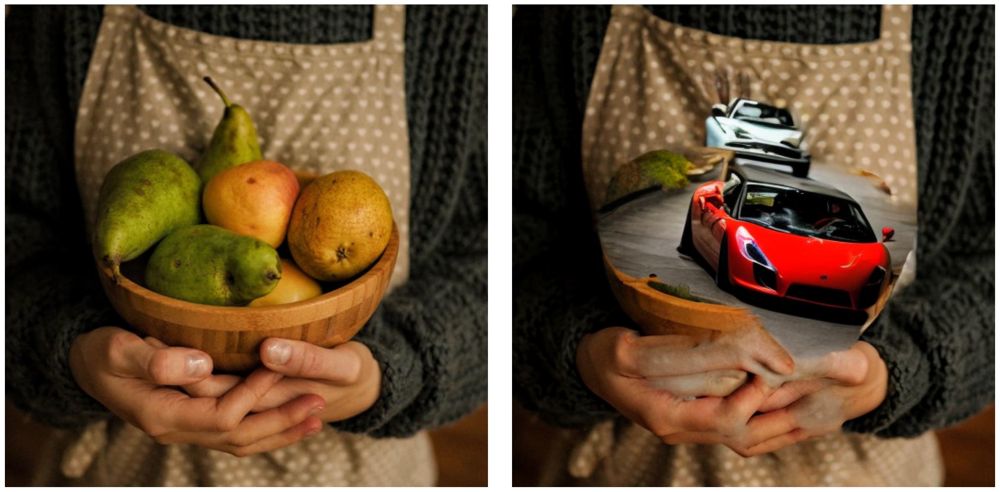

In [ ]:
caption = "bowl of fruits"
query = "sports cars"

diffedit(fruit_bowl_image, caption, query, noise_strength=1, seed=1)

## Conclusion

When working on this DiffEdit pipeline we set out to implement the techniques in the paper using our own custom pipeline. As you can see in the example above, we were able to achieve this with accurate mask generation and decent final image replacement. This shows that DiffEdit is a very powerful technique, and it was surprisingly easy to adapt an img2img pipeline to work with the DiffEdit technique. The ability to pass in just two different text prompts and have an accurate mask generated as a result was truly impressive.

There is still more for us to explore with this technique, from tweaking the various parameters further to tune both the mask creation and the image generation, to further understanding what prompts give the best results. It would also be interesting to adapt this to work with Stable Diffusion 2 or SDXL and see how that affects both the mask creation and final image generation.

An interesting use case for a DiffEdit-like technique is Google's [Magic Eraser](https://blog.google/products/photos/magic-eraser-android-ios-google-one/), where it automatically creates a mask which highlights people in the background of an image, and then replaces those people with a continuation of the scenery rather than another object. It could be a fun extension task to try and adapt this pipeline to take in an image and try to remove people from the background automatically.